In [ ]:
cd("/home/ritaferi/Phd/SSDdev/")
using Pkg
Pkg.activate(".")
Pkg.instantiate()

using SolidStateDetectors
using Unitful
using Plots
using LegendHDF5IO
using HDF5



In [ ]:
using Random
using SpecialFunctions

In [ ]:
t_ann = 18 * 60 # 18 minutes in seconds
T_ann = 623 
Na = 3*10^9
R = 1.98

H = if 473 <= T_ann <= 873
    11800
else
    10700
end

D0 = if 473 <= T_ann <= 873
    2.5*10^(-3)
else
    1.3*10^(-3)
end

Ns = 10^(21.27 - 2610/T_ann)


In [ ]:
D_Li = D0 * exp(-H / (R * T_ann))

Nd(x) = Ns .* erfc.(x ./ (2 * sqrt(D_Li * t_ann)))
NI_net(x) = Nd(x) .- Na


In [ ]:

using LaTeXStrings




x = 0:0.001: 0.12

idx = findall(abs.(Nd.(x) .- Na) .< 1e9)  # tolerance for numerical comparison
x_intersect = x[idx][1]  # take the first intersection


mask = NI_net.(x) .> 0

plot(x[mask] .* 10,
     NI_net.(x[mask]),
     label="Net impurity",
     color = :red,
     yscale=:log10,
     frame = :box, lw = 3)
hline!([Na], label="Acceptor", color=:green)

vline!([x_intersect*10], label="p-n boundary", color=:purple, lw=3, ls=:dot)

plot!(x .* 10, Nd.(x),
     label="Donor",
     color=:orange,
     ls=:dash, yscale= :log10,
     lw = 3)

plot!(xticks = 0:0.1:1.2, 
     yticks = 10 .^ (0:1:17),
     xguidefontsize = 16,          # dimensione label asse x
    yguidefontsize = 16,          # dimensione label asse y
    tickfontsize = 15,             # dimensione numeri dei tick su entrambi gli assi
    legendfontsize = 14 ,  
     xlims=(0, 1.2), xlabel="Depth (mm)", ylabel=L"Impurity concentration (cm^{-3})",  legend=:topright, size=(800, 600))
#savefig("/home/ritaferi/Phd/ChargeTrappingModel_dev/plot/Impurity_profile.png")



# working on the PDF

In [ ]:
using QuadGK
L = 0.2 # 2mm in cm
int_N, err = quadgk(Nd, 0, L)
println("Integrale numerico: ", val, "errore: ", err)

In [ ]:
n_points = 1000
x = 0: (L/n_points):L
Nd_data = Nd.(x);


In [ ]:

# Normalizzazione per PDF
dx = L/n_points
pdf_vals = Nd_data ./sum(Nd_data .* dx) ; # somma ≈ 1
plot(x_vals  .* 10, pdf_vals,
    xlabel="x [mm]",
    ylabel="PDF",
    title="PDF di Nd(x)",  
    lw=2)

In [ ]:
cdf_prova = cumsum(pdf_vals * dx);

plot(x_vals .* 10, cdf_prova, label="CDF", xlabel="x [mm]", ylabel="CDF", lw=2)


In [ ]:
# ------------------------------
# 2D posizioni casuali (XY)
# ------------------------------
# Dimensioni rettangolo
Lx = 0.2  # spessore [cm]
Ly = 0.2    # lunghezza Y [cm]

A = Ly * Lx
# Numero di campioni desiderati gestibile
N_total_desired = 1000

# Calcolo proporzionale per fetta
weights = Nd_data .* dx
weights_scaled = round.(Int, weights ./ sum(weights) .* N_total_desired)

positions = Float64[]
for i in 1:length(x)-1
    for j in 1:weights_scaled[i]
        push!(positions, x[i] + rand() * dx)
    end
end

println("Generati $(length(positions)) posizioni di Li")

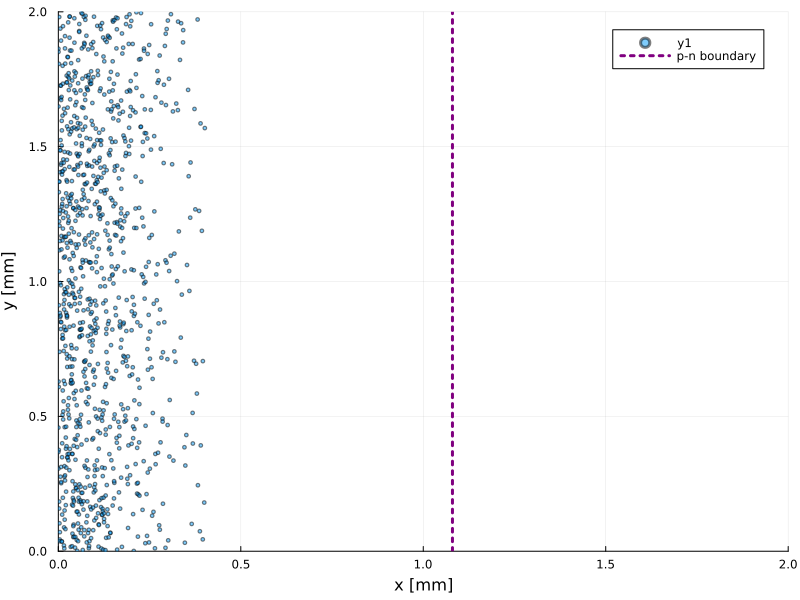

In [98]:
# ------------------------------
# 2D posizioni casuali (XY)
# ------------------------------
# Dimensioni rettangolo
Lx = 0.2  # spessore [cm]
Ly = 0.2    # lunghezza Y [cm]

y_positions = rand(length(positions)) .* Ly  # campiona uniformemente Y
scatter(positions .*10, y_positions .*10  , markersize=2, alpha=0.5,
        xlabel="x [mm]", ylabel="y [mm]")
plot!(xlims=(0, 2), ylims=(0, 2), size=(800, 600)  )
vline!([x_intersect*10], label="p-n boundary", color=:purple, lw=3, ls=:dot)

# 3D

In [ ]:

Lx = 0.2    # spessore X = 2 mm = 0.2 cm
Ly = 0.2    # lunghezza Y
Lz = 0.2    # altezza Z

dx = 0.005          # spessore fetta lungo X
x = 0:dx:Lx         # dominio X

# ------------------------------
# Scaling per campioni gestibili
# ------------------------------
N_total_desired = 0   # numero totale di punti 3D

weights = Nd_data[1:end-1] .* dx          # usa solo i valori fino alla penultima X
weights_scaled = round.(Int, weights ./ sum(weights) .* N_total_desired)

# ------------------------------
# Generazione posizioni 3D
# ------------------------------
positions_x = Float64[]
positions_y = Float64[]
positions_z = Float64[]

for i in 1:length(x)-1
    n_atoms = weights_scaled[i]
    for j in 1:n_atoms
        push!(positions_x, x[i] + rand()*dx)
        push!(positions_y, rand()*Ly)
        push!(positions_z, rand()*Lz)
    end
end

println("Generati $(length(positions_x)) posizioni di Li nel cubo 3D")

pdf = weights ./ sum(weights)
plot(x, pdf, xlabel="x [cm]", ylabel="PDF normalizzata", lw=2, label="PDF")


Generati 0 posizioni di Li nel cubo 3D


In [87]:
@show length(x)
@show length(weights_scaled)

length(x) = 41
length(weights_scaled) = 1000


1000

In [96]:
# ------------------------------
# Parametri geometrici
# ------------------------------
Lx = 0.2    # spessore X = 2 mm = 0.2 cm
Ly = 0.2    # lunghezza Y
Lz = 0.2    # altezza Z
dx = 0.005  # spessore fetta lungo X
x = 0:dx:Lx # dominio X

# ------------------------------
# Profilo Nd(x)
# ------------------------------
# supponendo Nd_data già calcolato come
# Nd_data = Ns .* erfc.(x ./ (2*sqrt(D_Li*t_ann)))

# ------------------------------
# Calcolo PDF discreta
# ------------------------------
pdf = Nd_data[1:end-1] ./ sum(Nd_data[1:end-1] .* dx)  # normalizzazione corretta
cdf = cumsum(pdf .* dx)                                 # CDF corretta

plot(x[1:end-1], pdf, xlabel="x [cm]", ylabel="PDF normalizzata", lw=2, label="PDF")
plot!(x[1:end-1], cdf, lw=2, label="CDF")             # opzionale

# ------------------------------
# Generazione posizioni 3D
# ------------------------------
N_total_desired = 100  # esempio: numero totale di punti
weights_scaled = round.(Int, pdf .* N_total_desired)  # pesi discreti

positions_x = Float64[]
positions_y = Float64[]
positions_z = Float64[]
x_pdf = x[1:end-1]    # usa solo i punti corrispondenti al pdf
for i in 1:min(length(weights_scaled), length(x_pdf))
    n_atoms = weights_scaled[i]
    for j in 1:n_atoms
        push!(positions_x, x_pdf[i] + rand()*dx)
        push!(positions_y, rand()*Ly)
        push!(positions_z, rand()*Lz)
    end
end

println("Generati $(length(positions_x)) posizioni di Li nel cubo 3D")

Generati 8624 posizioni di Li nel cubo 3D


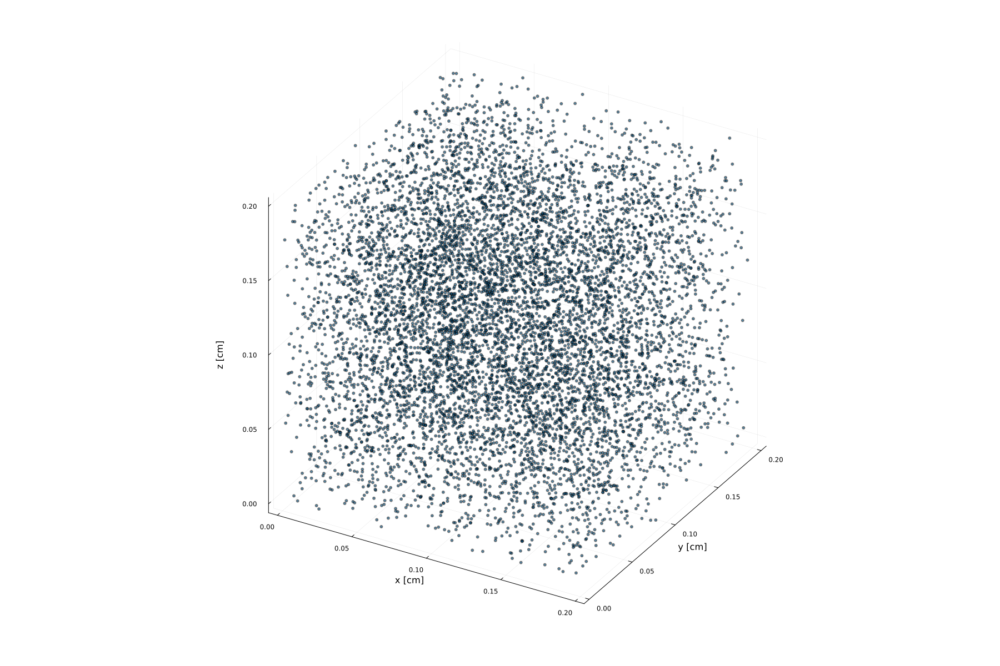

attempt to save state beyond implementation limit


In [97]:
# ------------------------------
scatter(positions_x, positions_y, positions_z,
 markersize=2, alpha=0.5, 
 xlabel="x [cm]", ylabel="y [cm]", zlabel="z [cm]",
  legend=false, size = (1800, 1200))

Generati 20000 punti 3D


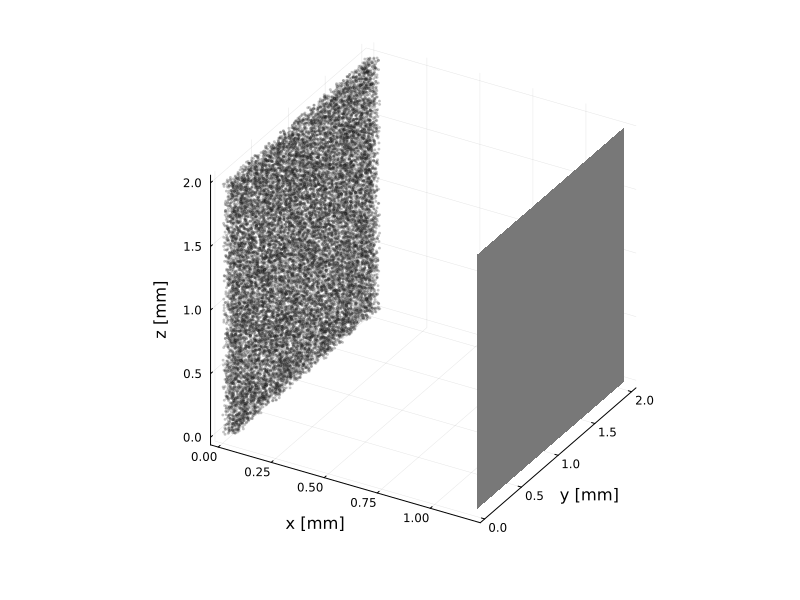

In [19]:
Lx = 0.2    # spessore X = 2 mm = 0.2 cm
Ly = 0.2    # lunghezza Y
Lz = 0.2    # altezza Z

dx = 0.005
x = 0:dx:Lx

# Funzione concentrazione Li lungo X
Ns = 1e15
D_Li = 1e-10
t_ann = 3600
Nd(x) = Ns .* erfc.(x ./ (2*sqrt(D_Li * t_ann)))
Nd_data = Nd(x)

# Scaling per campione gestibile
N_total_desired = 20000
weights = Nd_data .* dx
weights_scaled = round.(Int, weights ./ sum(weights) .* N_total_desired)

# Generazione posizioni 3D
positions_x = Float64[]
positions_y = Float64[]
positions_z = Float64[]

for i in 1:length(x)-1
    n_atoms = weights_scaled[i]
    for j in 1:n_atoms
        push!(positions_x, x[i] + rand()*dx)
        push!(positions_y, rand()*Ly)
        push!(positions_z, rand()*Lz)
    end
end

println("Generati $(length(positions_x)) punti 3D")

# =========================
# Creazione piano a x = 1.2 mm
# =========================
x_plane = 0.12   # 1.2 mm in cm
dy = 0.005
dz = 0.005

y = 0:dy:Ly
z = 0:dz:Lz

# Meshgrid manuale in Julia
Y = repeat(y', length(z), 1)
Z = repeat(z, 1, length(y))
X = fill(x_plane, size(Y))

# =========================
# Plot combinato
# =========================
# Piano trasparente blu + punti cubo grigi
surface(X .*10, Y .*10, Z .*10, color=:grey, alpha=0.2, legend=false,
        xlabel="x [mm]", ylabel="y [mm]", zlabel="z [mm]")

scatter!(positions_x .*10, positions_y .*10, positions_z .*10,
         markersize=1, alpha=0.2, color=:gray, size =(800, 600))

## Box

In [20]:
using Plots
gr()  # backend 3D semplice e veloce

# dimensioni cubo
L = 50  # mm

# vertici del cubo
xv = [0, L]
yv = [0, L]
zv = [0, L]

# inizializza plot 3D
plot(; legend=false)

# fondo e cima (piano XY)
for z in zv
    X = [xv xv; xv xv]
    Y = [yv[1] yv[1]; yv[2] yv[2]]
    Z = fill(z, 2, 2)  # matrice 2x2
    surface!(X, Y, Z, alpha=0.5, color=:blue)
end

# lati (piani XZ)
for y in yv
    X = [xv xv; xv xv]
    Z = [zv[1] zv[1]; zv[2] zv[2]]
    Y = fill(y, 2, 2)
    surface!(X, Y, Z, alpha=0.5, color=:green)
end

# lati (piani YZ)
for x in xv
    Y = [yv yv; yv yv]
    Z = [zv[1] zv[1]; zv[2] zv[2]]
    X = fill(x, 2, 2)
    surface!(X, Y, Z, alpha=0.5, color=:red)
end

# etichette assi e limiti
xlabel!("X (mm)")
ylabel!("Y (mm)")
zlabel!("Z (mm)")
xlims!(0,L)
ylims!(0,L)
zlims!(0,L)

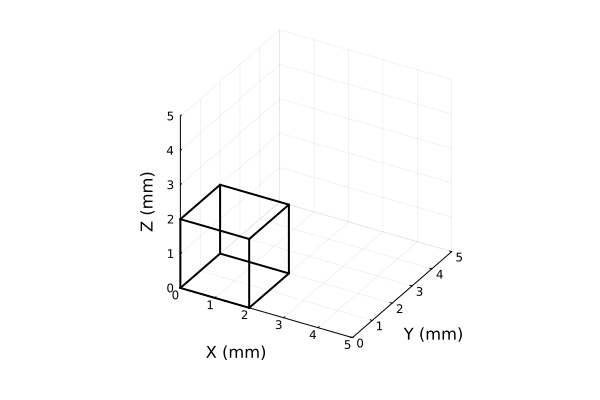

In [21]:
using Plots
gr()  # backend 3D

L = 2  # dimensione del cubo

# vertici del cubo
verts = [
    (0,0,0), (L,0,0), (L,L,0), (0,L,0),
    (0,0,L), (L,0,L), (L,L,L), (0,L,L)
]

# connessioni tra vertici per creare i bordi
edges = [
    (1,2),(2,3),(3,4),(4,1),  # fondo
    (5,6),(6,7),(7,8),(8,5),  # cima
    (1,5),(2,6),(3,7),(4,8)   # lati verticali
]

# inizializza plot
plot(; legend=false)
for (i,j) in edges
    x = [verts[i][1], verts[j][1]]
    y = [verts[i][2], verts[j][2]]
    z = [verts[i][3], verts[j][3]]
    plot!(x, y, z, color=:black, lw=2)
end

# etichette assi e limiti
xlabel!("X (mm)")
ylabel!("Y (mm)")
zlabel!("Z (mm)")
xlims!(0,5)
ylims!(0,5)
zlims!(0,5)

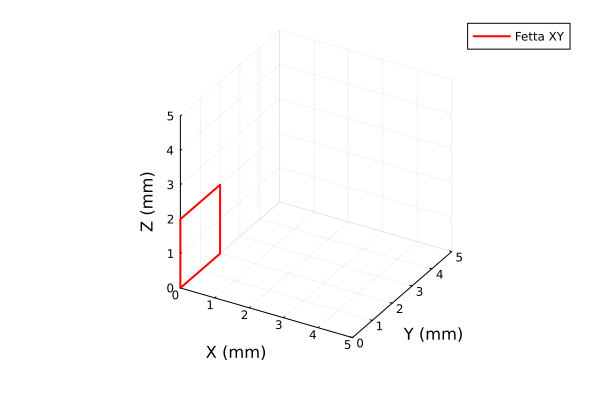

In [22]:
using Plots
gr()  # backend 3D

L = 2  # dimensione della fetta

# coordinate dei vertici del quadrato
x = [0, 0, 0, 0, 0]  # chiudiamo il quadrato tornando al primo punto
y = [0, L, L, 0, 0]
z = [0, 0, L, L, 0]  # piano z=0

# plot della fetta
plot(x, y, z, lw=2, color=:red, label="Fetta XY")

# etichette e limiti
xlabel!("X (mm)")
ylabel!("Y (mm)")
zlabel!("Z (mm)")
xlims!(0, 5)
ylims!(0,5)
zlims!(0,5)

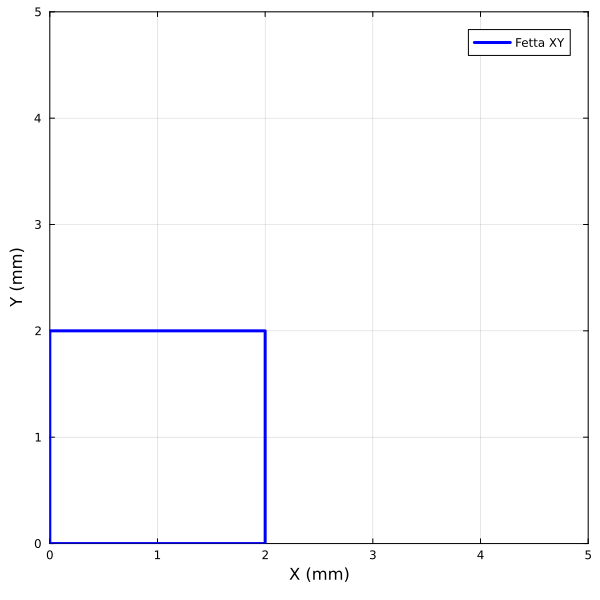

In [23]:
using Plots

L = 2  # dimensione del quadrato

# coordinate del quadrato sul piano XY
x = [0, L, L, 0, 0]  # chiudiamo il quadrato
y = [0, 0, L, L, 0]

# plot 2D
p = plot(x, y, lw=3, color=:blue, label="Fetta XY", frame=:box, size = (600, 600))
xlabel!("X (mm)")
ylabel!("Y (mm)")
xlims!(0, 5)
ylims!(0, 5)
aspect_ratio=:equal  # lati proporzionati
display(p)

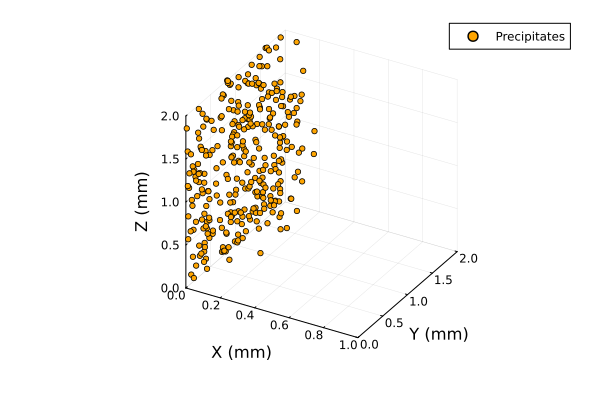

In [24]:
using Random, Plots, SpecialFunctions

# parametri fisici
Ns = 1e16           # concentrazione superficiale
D_Li = 1e-10        # cm^2/s
t_ann = 1e6         # s, tempo di annealing (per visualizzare bene)
dx = 0.1            # mm, spessore fetta
xmax = 1.0          # mm
ymax = 2.0          # mm
zmax = 2.0          # mm
N_points_per_slice = 200  # punti per fetta

# vettore di slice in X
x_slices = 0:dx:xmax

# lista finale dei punti
x_points = Float64[]
y_points = Float64[]
z_points = Float64[]

# ciclo su ogni fetta
for x in x_slices
    # Nd in questa fetta (converti x in cm)
    x_cm = x * 0.1
    Nd_slice = Ns * erfc(x_cm / (2*sqrt(D_Li*t_ann)))  # cm^-3
    
    # probabilità relativa normalizzata
    p_norm = Nd_slice / Ns   # tra 0 e 1

    # genera punti casuali in YZ
    for _ in 1:N_points_per_slice
        if rand() < p_norm
            push!(x_points, x)
            push!(y_points, rand()*ymax)
            push!(z_points, rand()*zmax)
        end
    end
end

# plot 3D
scatter(x_points, y_points, z_points, markersize=3, color=:orange, label="Precipitates")
xlabel!("X (mm)")
ylabel!("Y (mm)")
zlabel!("Z (mm)")
xlims!(0, xmax)
ylims!(0, ymax)
zlims!(0, zmax)


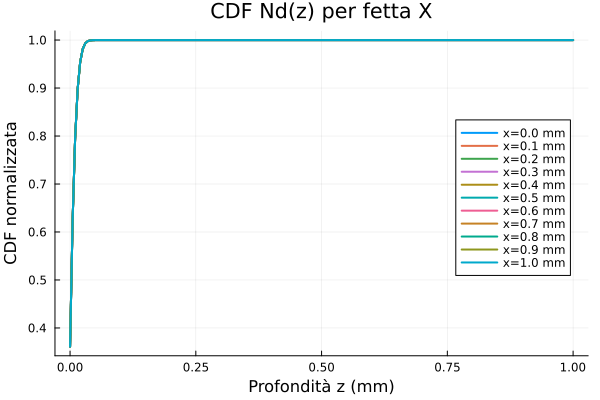

In [25]:
using Plots, SpecialFunctions

# parametri
Ns = 1e16
D_Li = 1e-10
t_ann = 1e6
xmax = 1.0   # mm
dx = 0.1
zmax = 1.0   # mm

# vettore di profondità z
z = range(0, zmax, length=200)

# vettore slice in X
x_slices = 0:dx:xmax

# inizializza il plot
plot(; xlabel="Profondità z (mm)", ylabel="CDF normalizzata", title="CDF Nd(z) per fetta X")

# ciclo su ogni fetta
for x in x_slices
    x_cm = x * 0.1  # converti mm -> cm
    Nd_z = Ns .* erfc.(z  ./ (2*sqrt(D_Li*t_ann)))  # z in cm
    cdf_z = cumsum(Nd_z)
    cdf_z ./= maximum(cdf_z)
    plot!(z, cdf_z, label="x=$(round(x, digits=2)) mm", lw=2)
end

plot!(legend=:right, grid=true)